In [212]:
import numpy as np
import matplotlib.pyplot as plt 
from mpl_toolkits.mplot3d import Axes3D 
from matplotlib.patches import Polygon
import matplotlib.pyplot as plt 
import matplotlib.image
import matplotlib.image as mpimg
from PIL import Image as im
import cv2 
from skimage.draw import polygon
from matplotlib.animation import PillowWriter
from sklearn.cluster import DBSCAN
from PIL import Image

In [3]:
def corrugated_roof(theta, f, N=200):
    x = np.linspace(-2,2,num = N)
    y = x 
    X,Y = np.meshgrid(x,y)
    omega = 2*np.pi*f 
    vals = 0.5*np.sin(omega*(X*np.sin(theta) + Y*np.cos(theta))) 
    return vals 

def fft_plotter(array, title1, title2):
    array_fft2 = np.fft.fftshift(np.fft.fft2(array))
    fig, ax = plt.subplots(1,2, figsize=(10,10))
    ax[0].imshow(array, cmap='gray')
    ax[0].set_title(title1)
    ax[1].imshow(abs(array_fft2), cmap='gray')
    ax[1].set_title(title2)

def plotter(array1, array2, title1, title2, size=(20,20)):
    fig, ax = plt.subplots(1,2, figsize=size)
    ax[0].imshow(array1, cmap='gray')
    ax[0].set_title(title1)
    ax[1].imshow(array2, cmap='gray')
    ax[1].set_title(title2)



# Rotation Property of Sinusoids

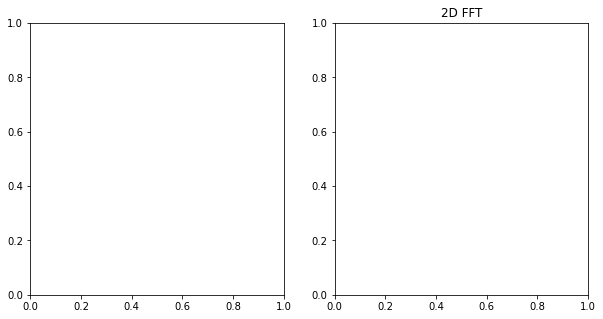

In [4]:
frequencies = np.linspace(0,10,20)
fig,ax = plt.subplots(1,2, figsize=(10,5))
metadata = dict(title='Movie', artist='ron')
ax[1].set_title('2D FFT')
writer = PillowWriter(fps=15, metadata=metadata) 

# with writer.saving(fig, 'sinusoid_varyingFreq.gif', 100):
#     for f in frequencies:
#         roof = corrugated_roof(0,f,100)
#         roof_fft2d = np.fft.fftshift(np.fft.fft2(roof))
#         ax[0].imshow(roof, cmap='gray')
#         ax[0].set_title('f={freq:.3f}'.format(freq=f))
#         ax[1].imshow(abs(roof_fft2d), cmap='gray')
#         writer.grab_frame()
        

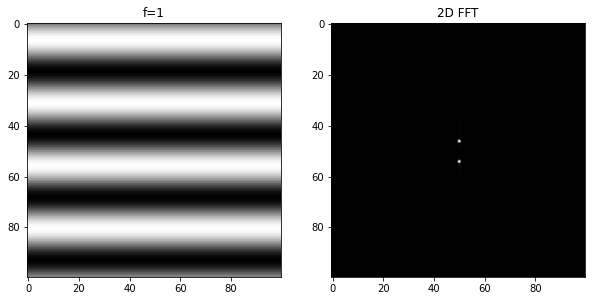

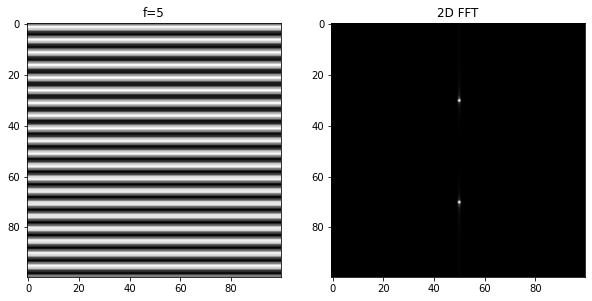

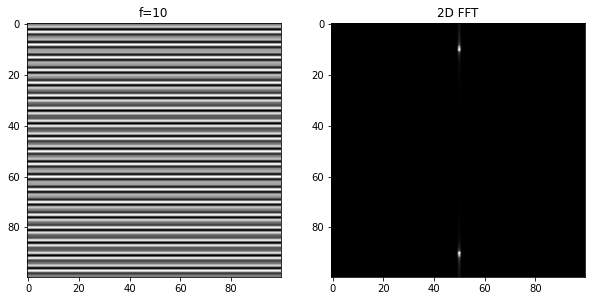

In [5]:
fft_plotter(corrugated_roof(0,1,100), 'f=1', '2D FFT')
fft_plotter(corrugated_roof(0,5,100), 'f=5', '2D FFT')
fft_plotter(corrugated_roof(0,10,100), 'f=10', '2D FFT')

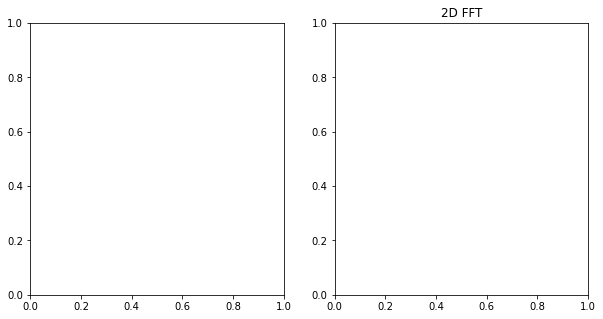

In [6]:
theta = np.linspace(0,np.pi,20)
fig,ax = plt.subplots(1,2, figsize=(10,5))
metadata = dict(title='Movie', artist='ron')
ax[1].set_title('2D FFT')
writer = PillowWriter(fps=15, metadata=metadata) 

# with writer.saving(fig, 'sinusoid_varyingTheta.gif', 100):
#     for deg in theta:
#         roof = corrugated_roof(deg,5,100)
#         roof_fft2d = np.fft.fftshift(np.fft.fft2(roof))
#         ax[0].imshow(roof, cmap='gray')
#         Deg = 180*deg/np.pi
#         ax[0].set_title('theta={deg:.3f} deg'.format(deg=Deg))
#         ax[1].imshow(abs(roof_fft2d), cmap='gray')
#         writer.grab_frame()

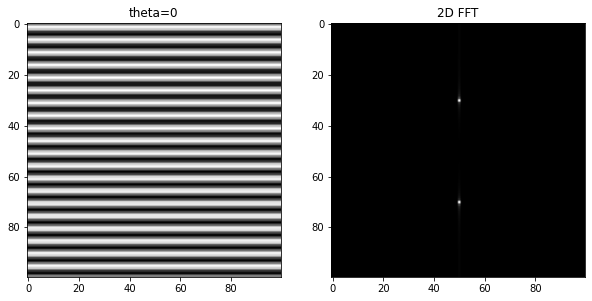

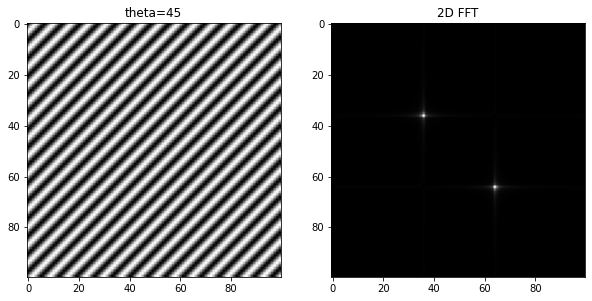

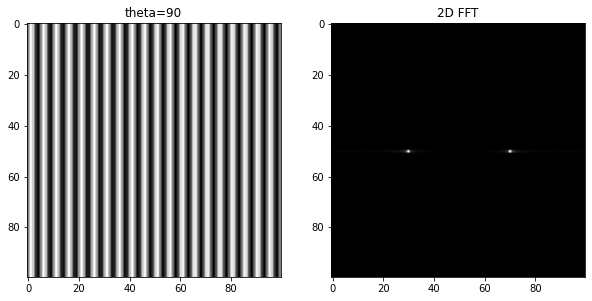

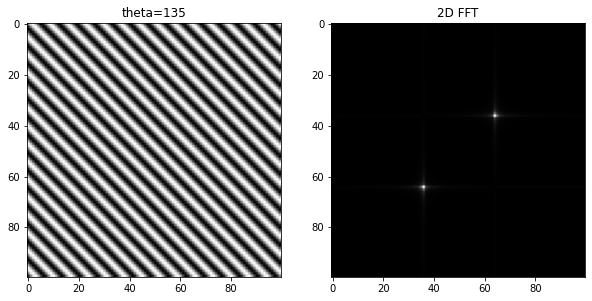

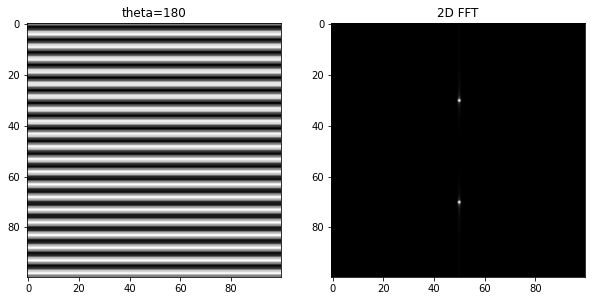

In [7]:
fft_plotter(corrugated_roof(0,5,100), 'theta=0', '2D FFT')
fft_plotter(corrugated_roof(np.pi/4,5,100), 'theta=45', '2D FFT')
fft_plotter(corrugated_roof(np.pi/2,5,100), 'theta=90', '2D FFT') 
fft_plotter(corrugated_roof(3*np.pi/4,5,100), 'theta=135', '2D FFT')
fft_plotter(corrugated_roof(np.pi,5,100), 'theta=180', '2D FFT')

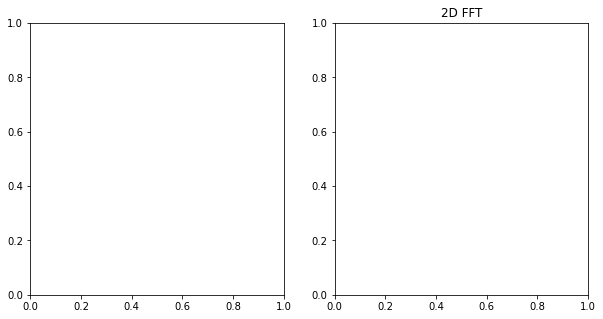

In [8]:
freqs = np.linspace(1,10,5) 
fig,ax = plt.subplots(1,2, figsize=(10,5))
metadata = dict(title='Movie', artist='ron')
ax[1].set_title('2D FFT')
writer = PillowWriter(fps=5, metadata=metadata) 
sinusoid = corrugated_roof(np.pi/4, 0.5, 100)
# with writer.saving(fig, 'compounding_sinusoid.gif', 100):
#     for f in freqs:
#         sinusoid = sinusoid*corrugated_roof(np.pi/4, f, 100)
#         sinusoid_fft2= np.fft.fftshift(np.fft.fft2(sinusoid))
#         ax[0].set_title('added f={val:.2f}'.format(val=f))
#         ax[0].imshow(sinusoid, cmap='gray')
#         ax[1].imshow(abs(sinusoid_fft2), cmap='gray') 
#         writer.grab_frame()


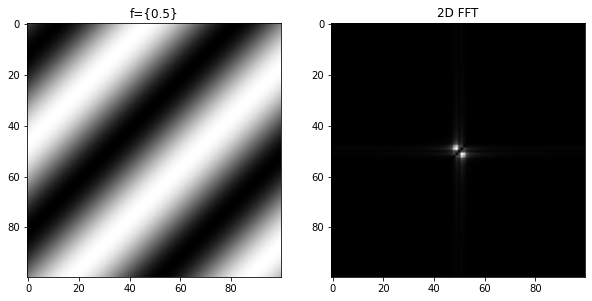

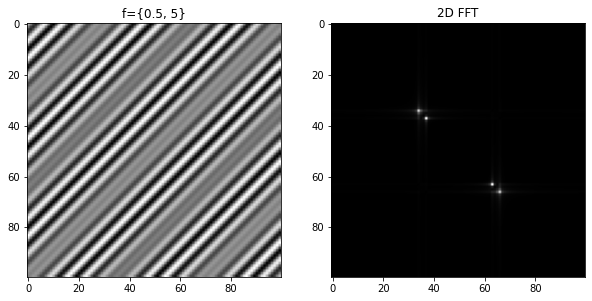

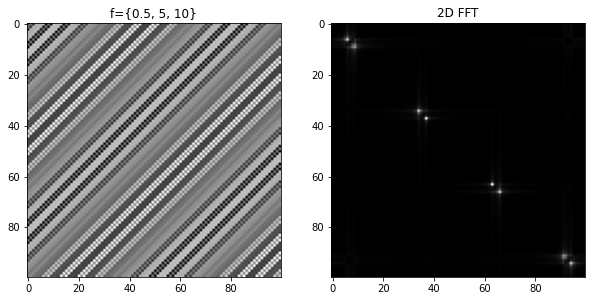

In [9]:
fft_plotter(corrugated_roof(np.pi/4, 0.5,100), 'f={0.5}', '2D FFT') 
fft_plotter(corrugated_roof(np.pi/4, 0.5,100)*corrugated_roof(np.pi/4, 5,100), 'f={0.5, 5}', '2D FFT')
fft_plotter(corrugated_roof(np.pi/4, 0.5,100)*corrugated_roof(np.pi/4, 5,100)*corrugated_roof(np.pi/4, 10,100), 'f={0.5, 5, 10}', '2D FFT')

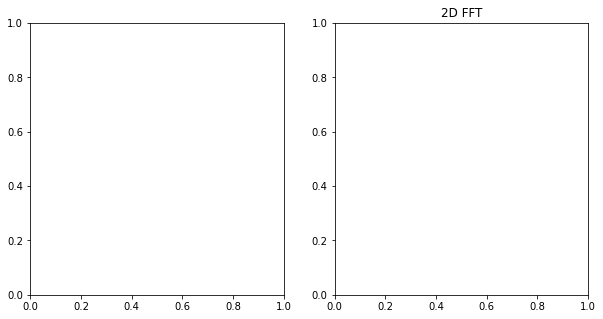

In [10]:
thetas = np.linspace(0,np.pi,70)
freqs = np.linspace(1,10, 70)
fig,ax = plt.subplots(1,2, figsize=(10,5))
metadata = dict(title='Movie', artist='ron')
ax[1].set_title('2D FFT')
writer = PillowWriter(fps=10, metadata=metadata) 
sinusoid = corrugated_roof(thetas[0], freqs[0], 150)

# with writer.saving(fig, 'compounding_sinusoid2.gif', 100):
#     for f, deg in zip(freqs[1:], thetas[1:]):
#         sinusoid = sinusoid*corrugated_roof(deg, f, 150)
#         sinusoid_fft2= np.fft.fftshift(np.fft.fft2(sinusoid))
#         ax[0].set_title('added f={val:.2f}, deg={val1:.2f}'.format(val=f, val1=180*deg/np.pi))
#         ax[0].imshow(sinusoid, cmap='gray')
#         ax[1].imshow(abs(sinusoid_fft2), cmap='gray') 
#         writer.grab_frame()

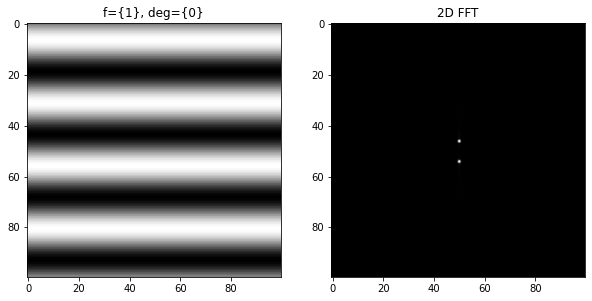

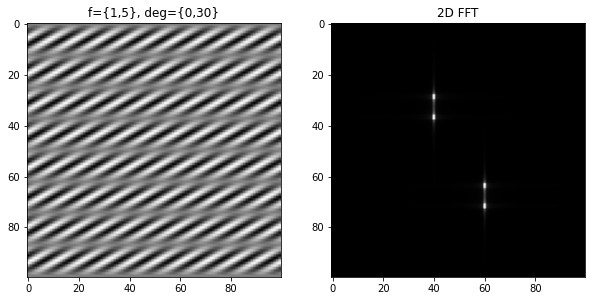

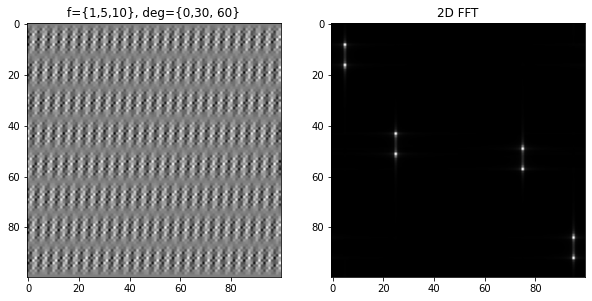

In [11]:
fft_plotter(corrugated_roof(0, 1, 100), 'f={1}, deg={0}', '2D FFT') 
fft_plotter(corrugated_roof(0, 1, 100)*corrugated_roof(np.pi/6, 5,100), 'f={1,5}, deg={0,30}', '2D FFT')
fft_plotter(corrugated_roof(0, 1, 100)*corrugated_roof(np.pi/6, 5,100)*corrugated_roof(np.pi/3, 10,100), 'f={1,5,10}, deg={0,30, 60}', '2D FFT')

# Fourier Filtering

In [12]:
def gray_contrast_stretch(img, low, high): 
    I_min = np.percentile(img, low)
    I_max = np.percentile(img, high) 
    new_img = (img - I_min)*255/(I_max - I_min)
    new_img[new_img<0] = 0 #clip those pixels below I_min
    new_img[new_img>255] = 255 #clip those pixels below I_max
    processed = np.array(new_img, dtype='uint8')
    return processed


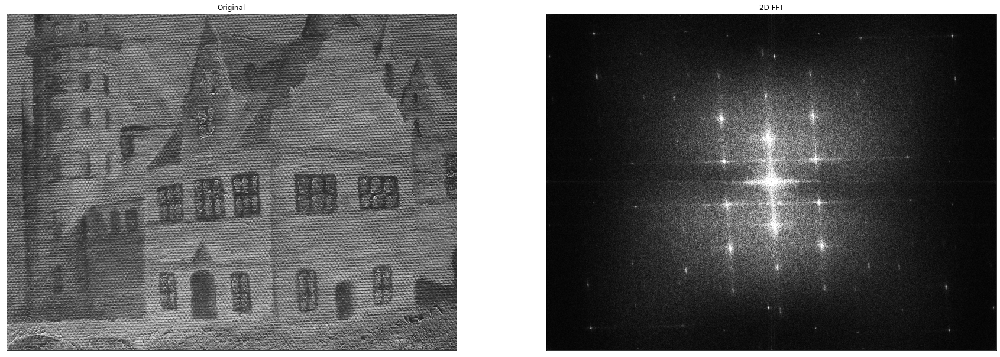

In [499]:
daria_painting = cv2.imread('185-8526_IMG.JPG', 0)

#Subtract the mean grayscale to the image to remove DC bias
daria_painting = daria_painting - np.mean(daria_painting)

daria_paint_fft2d = np.fft.fftshift(np.fft.fft2(daria_painting))
daria_paint_fft2d_stretched = gray_contrast_stretch(abs(daria_paint_fft2d),0, 99) 

fig,ax=plt.subplots(1,2, figsize=(30,30))
ax=ax.flatten()
ax[0].imshow(daria_painting, cmap='gray')
ax[0].set_title('Original')
ax[1].imshow(daria_paint_fft2d_stretched, cmap='gray') 
ax[1].set_title('2D FFT')

for i in range(2):
    ax[i].set_xticks([])
    ax[i].set_yticks([])

plt.savefig('Daria_painting_fft.png',dpi=300)

# Automated Filtering
Proposed algorithm:
1. Perform percentile thresholding on each mxn subarray of the MxN fft2 image (localized thresholds)
2. Use DBSCAN (density-based spatial clustering of applications with noise) algorithm to detect clusters of points (white specks) in a subarray.
3. For the points in the detected cluster, generate a "blot" to increase the size of the mask.
4. Remove all processing at the middle (cropping) to reduce image data loss.


In [15]:
def cropper(fft_array, L=0.08, W=0.2):
    Y,X = np.shape(fft_array)
    mask = np.ones((Y,X))
    cen = np.array([1/2, 1/2]) 
    cen_coord = np.array([cen[0]*Y, cen[1]*X])
    low_y = int(cen_coord[1] - np.round(W*Y/2))
    high_y = int(cen_coord[1] + np.round(W*Y/2))
    left_x = int(cen_coord[0] - np.round(L*X/2)) 
    right_x = int(cen_coord[0] + np.round(L*X/2)) 
    mask[left_x : right_x, low_y : high_y] = 0
    return fft_array*mask

def rect_cropper(arr, L=0.08, W=0.2):
    Y,X = np.shape(arr)
    mask = np.zeros((Y,X))
    cen = np.array([1/2, 1/2]) 
    cen_coord = np.array([cen[0]*Y, cen[1]*X])
    low_y = int(cen_coord[1] - np.round(W*Y/2))
    high_y = int(cen_coord[1] + np.round(W*Y/2))
    left_x = int(cen_coord[0] - np.round(L*X/2)) 
    right_x = int(cen_coord[0] + np.round(L*X/2))  
    mask[left_x : right_x, low_y : high_y] = 1
    return np.array(mask+arr, dtype='bool')

def reverse_rect_crop(arr, L=0.7, W=0.7):
    Y,X = np.shape(arr)
    mask = np.ones((Y,X))
    cen = np.array([1/2, 1/2]) 
    cen_coord = np.array([cen[0]*Y, cen[1]*X])
    low_y = int(cen_coord[1] - np.round(W*Y/2))
    high_y = int(cen_coord[1] + np.round(W*Y/2))
    left_x = int(cen_coord[0] - np.round(L*X/2)) 
    right_x = int(cen_coord[0] + np.round(L*X/2))  
    mask[left_x : right_x, low_y : high_y] = 0
    return np.array(mask+arr, dtype='bool')
    
def threshold_cropper(array, threshold): 
    arr=np.copy(array)
    I_max = np.percentile(array, threshold) 
    arr[array>I_max] = 0 
    return arr 

def threshold_masker(array, threshold):
    arr_new = np.ones((np.shape(array)[0], np.shape(array)[1]))
    I_max = np.percentile(array, threshold) 
    arr_new[array>I_max] = 0 
    return arr_new

In [16]:
def split_array(arr, M_sub, N_sub):
    # Determine the shape of the original array
    M, N = arr.shape

    # Determine the shape of the subarrays
    num_rows = M // M_sub + int(M % M_sub > 0)
    num_cols = N // N_sub + int(N % N_sub > 0)

    # Create a list to hold the subarrays
    subarrays = [[] for _ in range(num_rows)]

    # Split the original array into subarrays
    for row in range(num_rows):
        for col in range(num_cols):
            subarr = arr[row*M_sub:(row+1)*M_sub, col*N_sub:(col+1)*N_sub]
            subarrays[row].append(subarr)

    return subarrays 

def restore_array(subarrays, M_sub, N_sub):
    # Determine the shape of the original array
    M = len(subarrays) * M_sub
    N = len(subarrays[0]) * N_sub

    # Initialize the restored array
    restored_arr = np.zeros((M, N), dtype=subarrays[0][0].dtype)

    # Restore the subarrays to the original array
    for row, subrow in enumerate(subarrays):
        for col, subarr in enumerate(subrow):
            if subarr.size > 0:
                restored_arr[row*M_sub:row*M_sub+subarr.shape[0], col*N_sub:col*N_sub+subarr.shape[1]] = subarr

    return restored_arr

def detect_zero_clusters(array, eps, min_samples):
    # Flatten the array into a list of points
    points = [(i, j) for i in range(array.shape[0]) for j in range(array.shape[1]) if array[i, j] == 0]
    
    if len(points) == 0:
        # No clusters detected, return the original array
        return array
    
    # Run DBSCAN on the list of points
    clustering = DBSCAN(eps=eps, min_samples=min_samples).fit(points)
    
    # Get the indices of the points in the cluster
    cluster_indices = [i for i in range(len(points)) if clustering.labels_[i] == 0]
    
    # Create an empty array to hold the cluster
    cluster_array = np.ones_like(array)
    
    # Set the values of the cluster points in the array
    for i in cluster_indices:
        cluster_array[points[i]] = 0
    
    return cluster_array

def zero_indices(arr):
    flattened = arr.flatten()
    flattened_indices = [i for i in range(len(flattened)) if flattened[i]==0] 
    row_indices, col_indices = np.unravel_index(flattened_indices, arr.shape)
    return list(zip(row_indices, col_indices))

def blotter(arr, size=10):
    cen_trans = zero_indices(arr)
    for c in cen_trans: 
        low_y = int(c[1] - size)
        high_y = int(c[1] + size)
        left_x = int(c[0] - size) 
        right_x = int(c[0] + size) 
        arr[left_x : right_x, low_y : high_y] = 0 
    return arr


    

In [139]:
def auto_masking(arr, M_sub, N_sub, threshold=98, eps=3, min_samples=8, blot_size=7, L=0.08, W=0.2):
    M, N = arr.shape

    # Determine the shape of the subarrays
    num_rows = M // M_sub + int(M % M_sub > 0)
    num_cols = N // N_sub + int(N % N_sub > 0)

    # Create a list to hold the subarrays
    subarrays = [[] for _ in range(num_rows)]

    # Split the original array into subarrays
    for row in range(num_rows):
        for col in range(num_cols):
            subarr = arr[row*M_sub:(row+1)*M_sub, col*N_sub:(col+1)*N_sub]
            step1= threshold_masker(subarr, threshold) 
            step2= detect_zero_clusters(step1, eps=eps, min_samples=min_samples)
            if 0 in step2:
                step3=blotter(step2,size=blot_size) 
            else:
                step3=step2
            subarrays[row].append(step3)
            
    semi_restored1=restore_array(subarrays, M_sub=N_sub, N_sub=N_sub)[0:M,0:N]
    semi_restored2=rect_cropper(semi_restored1,L=L,W=W)
    return semi_restored2


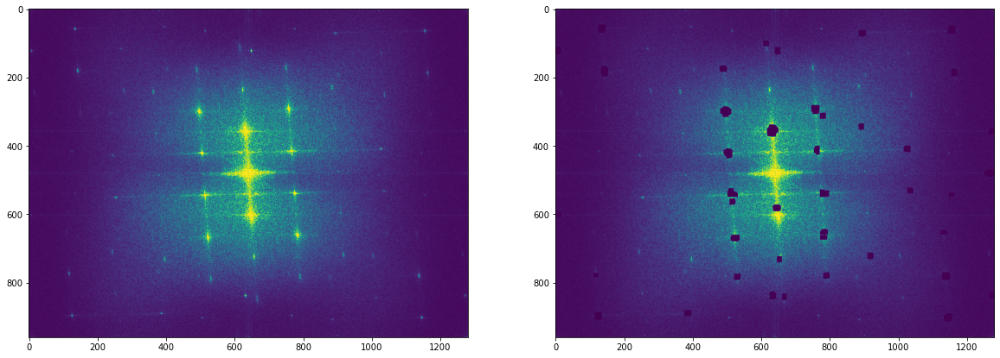

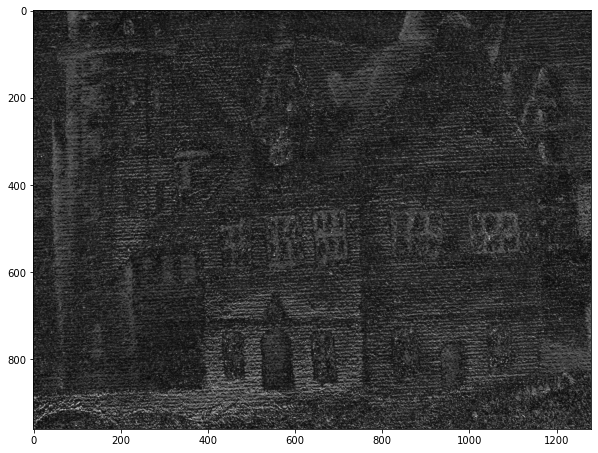

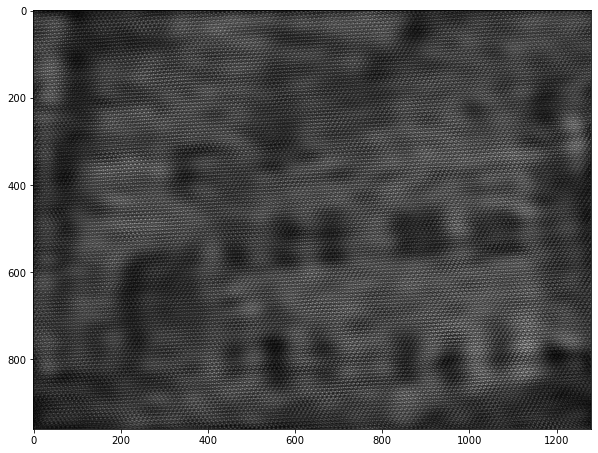

In [494]:
test = auto_masking(daria_paint_fft2d, 110,110)
fig,ax=plt.subplots(1,2, figsize=(20,20))
ax=ax.flatten()
ax[0].imshow(daria_paint_fft2d_stretched)
ax[1].imshow(daria_paint_fft2d_stretched*test) 

#Restored image 
masked=daria_paint_fft2d*test 
processed_img=cv2.normalize(abs(np.fft.ifft2(masked)), None, 0, 255, cv2.NORM_MINMAX)
plt.figure(figsize=(10,10))
plt.imshow(abs(processed_img),cmap='gray')

#Canvas weave
masked_weave=daria_paint_fft2d*np.logical_not(test)
processed_img_weave=cv2.normalize(abs(np.fft.ifft2(masked_weave)), None, 0, 255, cv2.NORM_MINMAX)
plt.figure(figsize=(10,10))
plt.imshow(abs(processed_img_weave),cmap='gray')

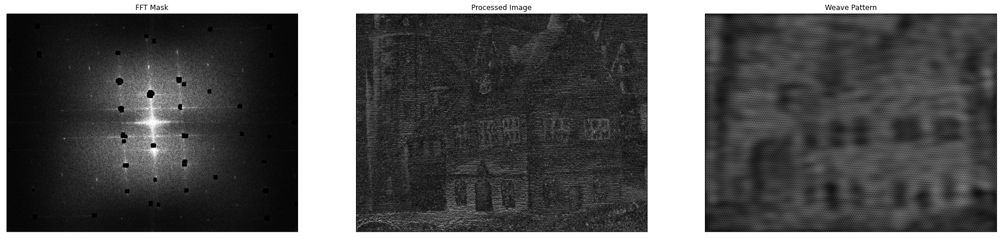

In [496]:
fig,ax=plt.subplots(1,3, figsize=(30,30))
ax=ax.flatten()
ax[0].imshow(daria_paint_fft2d_stretched*test, cmap='gray')
ax[0].set_title('FFT Mask')
ax[1].imshow(abs(processed_img), cmap='gray') 
ax[1].set_title('Processed Image')
ax[2].imshow(abs(processed_img_weave), cmap='gray') 
ax[2].set_title('Weave Pattern')

for i in range(3):
    ax[i].set_xticks([])
    ax[i].set_yticks([])

plt.savefig('Daria_paint_auto.png',dpi=300)

# Manual masking using GIMP

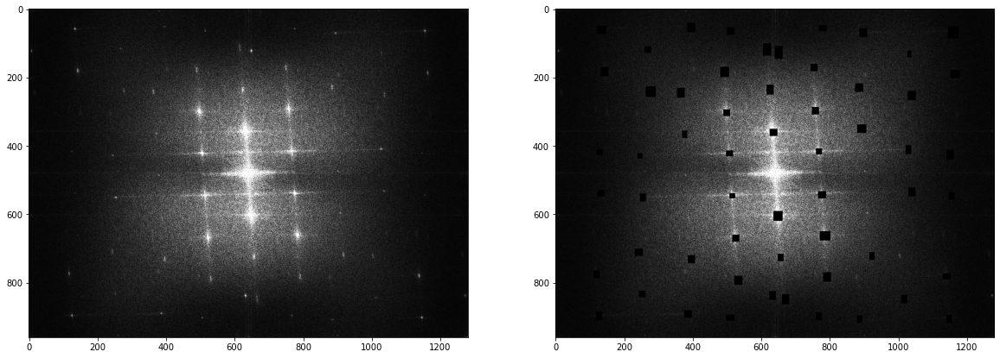

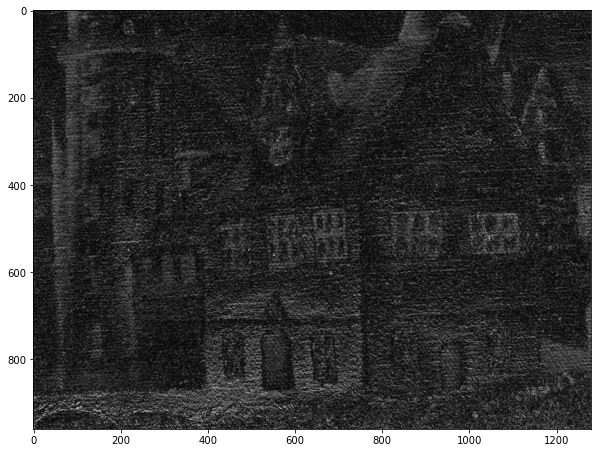

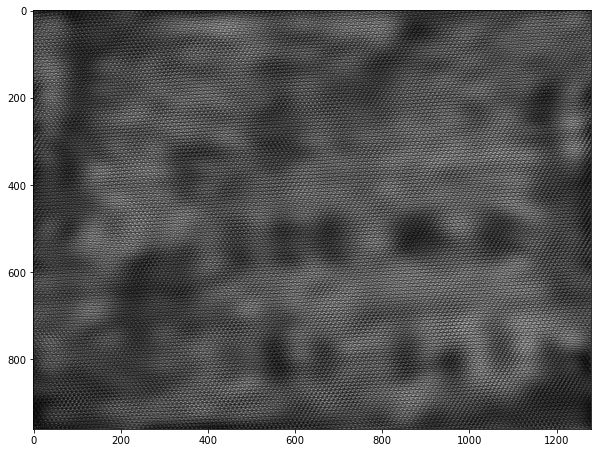

In [488]:
test_mask_manual = mpimg.imread('test_mask2.png')[:,:,3]
invert_mask = np.logical_not(test_mask_manual)
fig,ax=plt.subplots(1,2, figsize=(20,20))
ax=ax.flatten()
ax[0].imshow(daria_paint_fft2d_stretched, cmap='gray')
ax[1].imshow(daria_paint_fft2d_stretched*invert_mask, cmap='gray') 

masked=daria_paint_fft2d*(invert_mask)
processed_img=cv2.normalize(abs(np.fft.ifft2(masked)), None, 0, 255, cv2.NORM_MINMAX)
plt.figure(figsize=(10,10))
plt.imshow(abs(processed_img),cmap='gray')

#Canvas weave
masked_weave=daria_paint_fft2d*np.logical_not(invert_mask)
processed_img_weave=cv2.normalize(abs(np.fft.ifft2(masked_weave)), None, 0, 255, cv2.NORM_MINMAX)
plt.figure(figsize=(10,10))
plt.imshow(abs(processed_img_weave),cmap='gray')

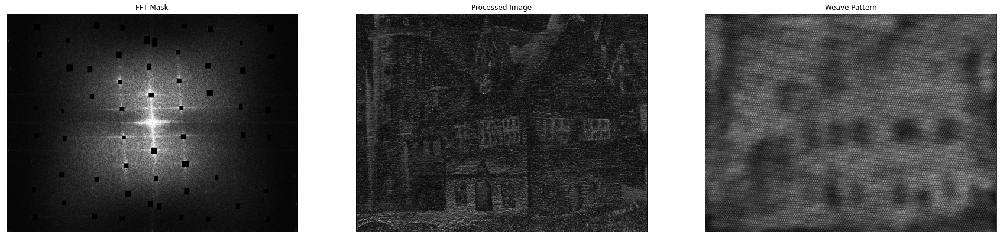

In [492]:
fig,ax=plt.subplots(1,3, figsize=(30,30))
ax=ax.flatten()
ax[0].imshow(daria_paint_fft2d_stretched*invert_mask, cmap='gray')
ax[0].set_title('FFT Mask')
ax[1].imshow(abs(processed_img), cmap='gray') 
ax[1].set_title('Processed Image')
ax[2].imshow(abs(processed_img_weave), cmap='gray') 
ax[2].set_title('Weave Pattern')

for i in range(3):
    ax[i].set_xticks([])
    ax[i].set_yticks([])

plt.savefig('Daria_paint_manual.png',dpi=300)

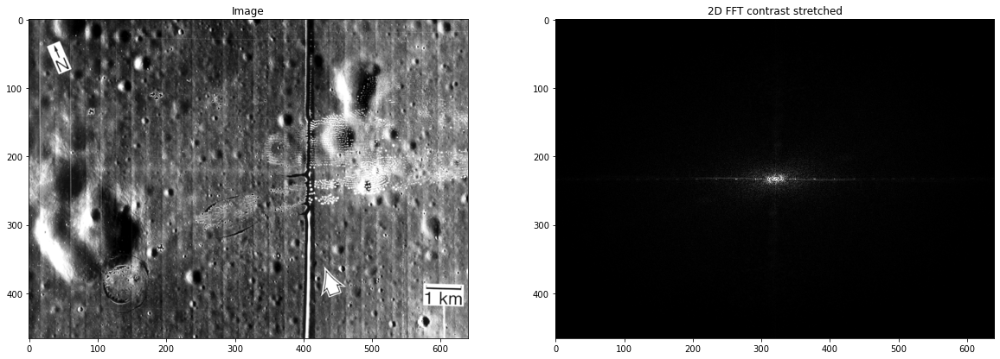

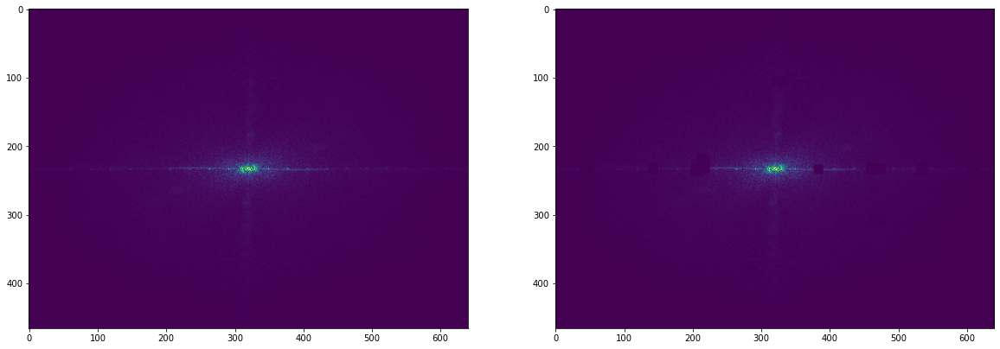

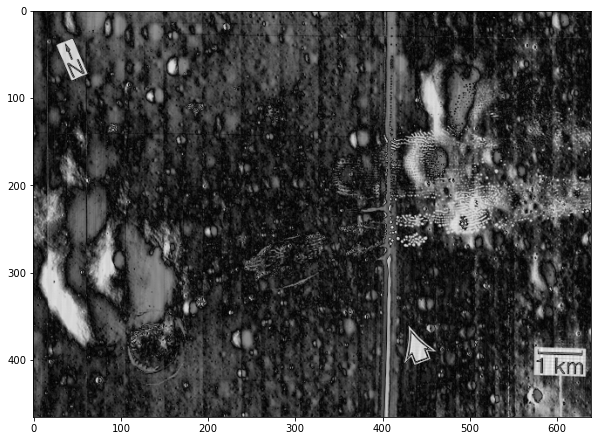

In [484]:
moon_pic=mpimg.imread('sapo_S05.gif')

#Subtract the mean grayscale to the image to remove DC bias
moon_pic = moon_pic- np.mean(moon_pic)

moonpic_fft2d = np.fft.fftshift(np.fft.fft2(moon_pic))
moonpic_fft2d_stretched = gray_contrast_stretch(abs(moonpic_fft2d),0, 99.99) 
plotter(moon_pic, moonpic_fft2d_stretched, 'Image', '2D FFT contrast stretched') 

test = auto_masking(moonpic_fft2d, M_sub=75,N_sub=75, threshold=99, eps=3,min_samples=5,blot_size=7,L=0.08,W=0.2)
fig,ax=plt.subplots(1,2, figsize=(20,20))
ax=ax.flatten()
ax[0].imshow(moonpic_fft2d_stretched)
ax[1].imshow(moonpic_fft2d_stretched*test) 

#Restored image 
masked=moonpic_fft2d*test 
processed_img=cv2.normalize(abs(np.fft.ifft2(masked)), None, 0, 255, cv2.NORM_MINMAX)
plt.figure(figsize=(10,10))
plt.imshow(abs(processed_img),cmap='gray')

#Weave pattern
# masked=moonpic_fft2d*np.logical_not(test)
# processed_img=abs(np.fft.ifft2(masked))
# plt.figure(figsize=(10,10))
# plt.imshow(abs(processed_img),cmap='gray') 



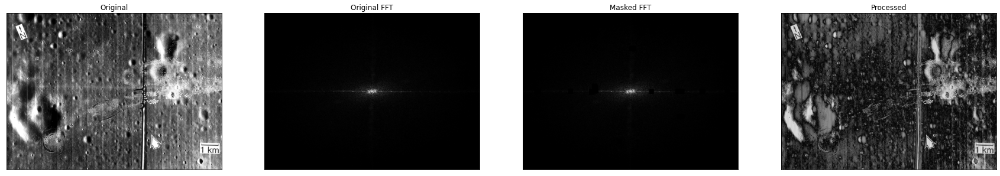

In [486]:
fig,ax=plt.subplots(1,4, figsize=(30,30))
ax=ax.flatten()
ax[0].imshow(moon_pic, cmap='gray')
ax[0].set_title('Original')
ax[1].imshow(moonpic_fft2d_stretched, cmap='gray') 
ax[1].set_title('Original FFT')
ax[2].imshow(moonpic_fft2d_stretched*test, cmap='gray') 
ax[2].set_title('Masked FFT')
ax[3].imshow(processed_img, cmap='gray') 
ax[3].set_title('Processed')

for i in range(4):
    ax[i].set_xticks([])
    ax[i].set_yticks([])

plt.savefig('Moon_pic_auto.png',dpi=300)

# Manual Masking

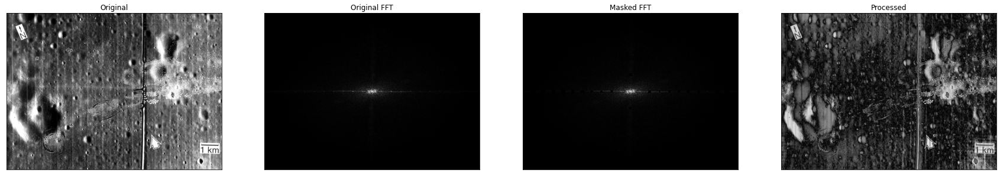

In [480]:
test_mask_manual = mpimg.imread('moonpic_test_mask.png')[:,:,3]
invert_mask = np.logical_not(test_mask_manual)


masked=moonpic_fft2d*(invert_mask)
processed_img=abs(np.fft.ifft2(masked))


fig,ax=plt.subplots(1,4, figsize=(30,30))
ax=ax.flatten()
ax[0].imshow(moon_pic, cmap='gray')
ax[0].set_title('Original')
ax[1].imshow(moonpic_fft2d_stretched, cmap='gray') 
ax[1].set_title('Original FFT')
ax[2].imshow(moonpic_fft2d_stretched*invert_mask, cmap='gray') 
ax[2].set_title('Masked FFT')
ax[3].imshow(processed_img, cmap='gray') 
ax[3].set_title('Processed')

for i in range(4):
    ax[i].set_xticks([])
    ax[i].set_yticks([])

plt.savefig('Moon_pic.png',dpi=300)

# Fingerprint Ridge Enhancement

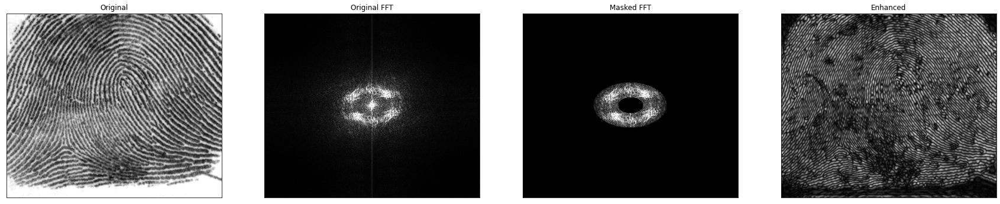

In [478]:
fingerprint = cv2.imread('fingerprint.jpeg', 0)

#Subtract the mean grayscale to the image to remove DC bias
fingerprint = fingerprint - np.mean(fingerprint)

fingerprint_fft2d = np.fft.fftshift(np.fft.fft2(fingerprint))
fingerprint_fft2d_stretched = gray_contrast_stretch(abs(fingerprint_fft2d),0, 99.5) 
test_mask_manual = mpimg.imread('fingerprint_mask.png')[:,:,3]
invert_mask = np.logical_not(test_mask_manual)

masked=fingerprint_fft2d*(invert_mask)
processed_img=abs(np.fft.ifft2(masked))
# processed_img=np.array(processed_img,dtype='bool')


fig,ax=plt.subplots(1,4, figsize=(30,30))
ax=ax.flatten()
ax[0].imshow(fingerprint, cmap='gray')
ax[0].set_title('Original')
ax[1].imshow(fingerprint_fft2d_stretched, cmap='gray') 
ax[1].set_title('Original FFT')
ax[2].imshow(fingerprint_fft2d_stretched*invert_mask, cmap='gray') 
ax[2].set_title('Masked FFT')
ax[3].imshow(processed_img, cmap='gray') 
ax[3].set_title('Enhanced')

for i in range(4):
    ax[i].set_xticks([])
    ax[i].set_yticks([])

plt.savefig('Fingerprint_enhanced.png',dpi=300)

# Convolution Theorem (Redux)

In [462]:
def dots(number=2, N=10): 
    y = np.linspace(0,N, N+1) 
    x = y 
    X,Y = np.meshgrid(x,y) 
    vals = np.zeros((N,N))
    cen = np.array([(1/2, (i+1)/(number+1)) for i in range(number)]) 
    cen_trans = np.array(cen*N, dtype='int')
    for c in cen_trans:
        vals[c[0], c[1]] = 1
    return vals 

def circles(number=2, D=0.1, N=100):
    x = np.linspace(-1,1,num = N)
    y= np.linspace(-1,1,num=N)
    x= y
    radius = D/2
    X,Y = np.meshgrid(x,y)
    cen = []
    if number%2 == 0: #If even number of circles, include the circle at the origin
        for i in range(1,number//2 +1): 
            cen.append((0,i/number))
            cen.append((0, -i/number)) 
    if number%2 == 1: #If odd circles, do not include circle centered at origin
        for i in range(1,number//2 +1): 
            cen.append((0,i/number))
            cen.append((0, -i/number)) 
        cen.append((0,0))
    A = np.zeros((N,N)) 
    for c in cen:
        R = np.sqrt((X-c[1])**2 + (Y)**2) #Setup an offcenter circle.
        A[np.where(R<radius)] = 1.0 
    return A 

def squares(number=2, width = 0.05, N=100): 
    y = np.linspace(0,N, N+1) 
    x = y 
    X,Y = np.meshgrid(x,y) 
    vals = np.zeros((N,N))
    cen = np.array([(1/2, (i+1)/(number+1)) for i in range(number)]) 
    cen_trans = np.array(cen*N, dtype='int')
    for c in cen_trans:
        low_y = int(c[1] - np.round(width*N/4))
        high_y = int(c[1] + np.round(width*N/4))
        left_x = int(c[0] - np.round(width*N/4)) 
        right_x = int(c[0] + np.round(width*N/4)) 
        vals[left_x : right_x, low_y : high_y] = 1
    return vals 

def dots_array(n=10, N=200):
    a=np.zeros((N,N))
    for i in range(n):
        a[np.random.randint(N), np.random.randint(N)] = 1
    return a

def cross(width=1, length=9, N=200): #arbitary 9x9 pattern
    vals = np.zeros((N,N)) 
    min_x, max_x= int(N//2-width), int(N//2+width)
    min_y, max_y = int(N//2-np.floor(length/2)), int(N//2+np.floor(length/2))
    vals[min_x:max_x, min_y:max_y] =1 
    vals[min_y:max_y, min_x:max_x] =1 
    return vals


def ones_cross(spacing, N=200):
    r= np.arange(0,N, spacing)
    a = np.zeros((N,N))
    a[N//2, r]=1 
    a[r, N//2]=1
    return a


## Two dots

[[100  66]
 [100 133]]


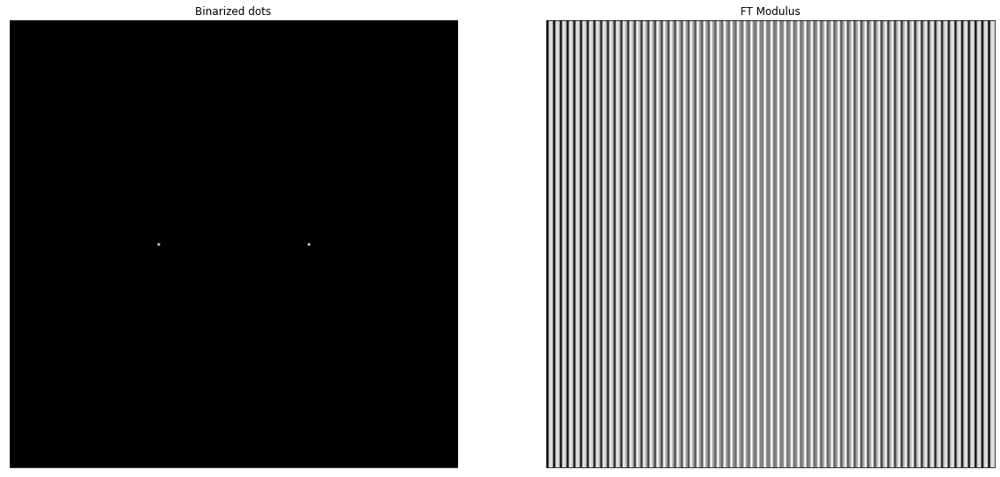

In [441]:
binary_dots = dots(2,200)
binary_dots_fft2d = np.fft.fftshift(np.fft.fft2(binary_dots))

fig,ax = plt.subplots(1,2,figsize=(20,20)) 
ax=ax.flatten()
ax[0].imshow(binary_dots, cmap='gray')
ax[1].imshow(abs(binary_dots_fft2d), cmap='gray')
ax[0].set_title('Binarized dots')
ax[1].set_title('FT Modulus')
for i in range(2):
    ax[i].set_xticks([])
    ax[i].set_yticks([])
plt.savefig('convolution_redux1.png', dpi=200)

## Two circles of varying radii. See GIF

(0, 0.5)
(200, 200)
(0, -0.5)
(200, 200)
(0, 0.5)
(200, 200)
(0, -0.5)
(200, 200)
(0, 0.5)
(200, 200)
(0, -0.5)
(200, 200)
(0, 0.5)
(200, 200)
(0, -0.5)
(200, 200)
(0, 0.5)
(200, 200)
(0, -0.5)
(200, 200)
(0, 0.5)
(200, 200)
(0, -0.5)
(200, 200)
(0, 0.5)
(200, 200)
(0, -0.5)
(200, 200)
(0, 0.5)
(200, 200)
(0, -0.5)
(200, 200)
(0, 0.5)
(200, 200)
(0, -0.5)
(200, 200)
(0, 0.5)
(200, 200)
(0, -0.5)
(200, 200)
(0, 0.5)
(200, 200)
(0, -0.5)
(200, 200)
(0, 0.5)
(200, 200)
(0, -0.5)
(200, 200)
(0, 0.5)
(200, 200)
(0, -0.5)
(200, 200)
(0, 0.5)
(200, 200)
(0, -0.5)
(200, 200)
(0, 0.5)
(200, 200)
(0, -0.5)
(200, 200)
(0, 0.5)
(200, 200)
(0, -0.5)
(200, 200)
(0, 0.5)
(200, 200)
(0, -0.5)
(200, 200)
(0, 0.5)
(200, 200)
(0, -0.5)
(200, 200)
(0, 0.5)
(200, 200)
(0, -0.5)
(200, 200)
(0, 0.5)
(200, 200)
(0, -0.5)
(200, 200)
(0, 0.5)
(200, 200)
(0, -0.5)
(200, 200)
(0, 0.5)
(200, 200)
(0, -0.5)
(200, 200)
(0, 0.5)
(200, 200)
(0, -0.5)
(200, 200)
(0, 0.5)
(200, 200)
(0, -0.5)
(200, 200)
(0, 0.5)
(200, 2

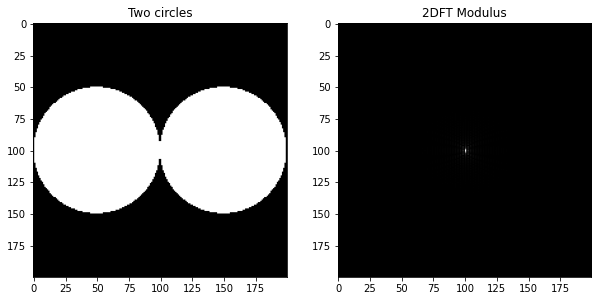

In [450]:
radii = np.linspace(0.01,1,50) 
fig,ax = plt.subplots(1,2,figsize=(10,5)) 
ax=ax.flatten()
ax[0].set_title('Two circles')
ax[1].set_title('2DFT Modulus')

metadata = dict(title='Movie', artist='ron')
writer = PillowWriter(fps=5, metadata=metadata) 

with writer.saving(fig, 'convolution_redux2.gif', 100):
    for r in radii:
        two_circles = circles(2,r,200)
        two_circles_fft2d = np.fft.fftshift(np.fft.fft2(two_circles))
        ax[0].imshow(two_circles, cmap='gray')
        ax[1].imshow(abs(two_circles_fft2d), cmap='gray')
        writer.grab_frame()
        

## Two squares of varying width

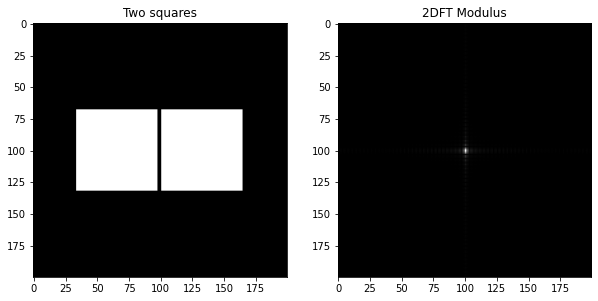

In [473]:
width = np.linspace(0.01,0.65,50) 
fig,ax = plt.subplots(1,2,figsize=(10,5)) 
ax=ax.flatten()
ax[0].set_title('Two squares')
ax[1].set_title('2DFT Modulus')

metadata = dict(title='Movie', artist='ron')
writer = PillowWriter(fps=5, metadata=metadata) 

with writer.saving(fig, 'convolution_redux3.gif', 100):
    for w in width:
        two_squares = squares(2,w,200)
        two_squares_fft2d = np.fft.fftshift(np.fft.fft2(two_squares))
        ax[0].imshow(two_squares, cmap='gray')
        ax[1].imshow(abs(two_squares_fft2d), cmap='gray')
        writer.grab_frame()
        

## Pattern replication

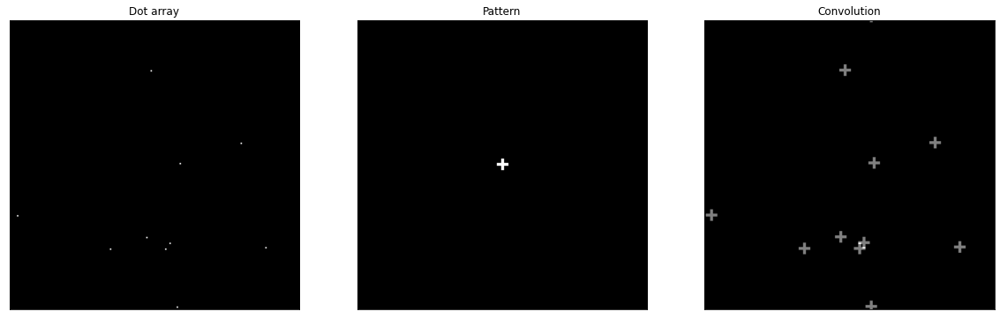

In [437]:
dirac_deltas = dots_array(10, N=200)
pattern=cross(N=200)

pattern_fft2d = np.fft.fftshift(np.fft.fft2(pattern)) 
dots_array_fft2d = np.fft.fftshift(np.fft.fft2(dirac_deltas))

convolved = dots_array_fft2d*pattern_fft2d 
deconvolved = np.fft.fftshift(np.fft.ifft2(convolved))

fig,ax = plt.subplots(1,3,figsize=(20,20)) 
ax=ax.flatten()
ax[0].imshow(dirac_deltas, cmap='gray')
ax[0].set_title('Dot array')
ax[1].imshow(pattern, cmap='gray')
ax[1].set_title('Pattern')
ax[2].imshow(abs(deconvolved), cmap='gray') 
ax[2].set_title('Convolution') 

for i in range(3):
    ax[i].set_xticks([])
    ax[i].set_yticks([])

plt.savefig('convolution_redux5.png',dpi=200)


## Equally-spaced ones

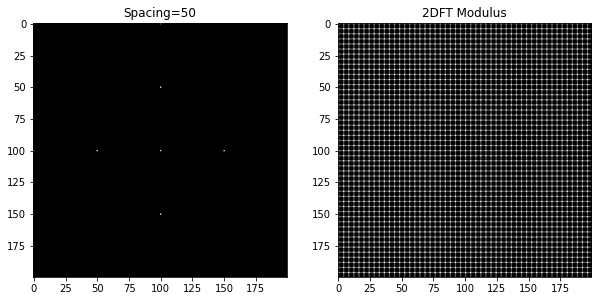

In [472]:
gaps = [i for i in range(1,51)] 
fig,ax = plt.subplots(1,2,figsize=(10,5)) 
ax=ax.flatten()

ax[1].set_title('2DFT Modulus')

metadata = dict(title='Movie', artist='ron')
writer = PillowWriter(fps=5, metadata=metadata) 

with writer.saving(fig, 'convolution_redux6.gif', 100):
    for g in gaps:
        cross = ones_cross(g)
        cross_fft2d = np.fft.fftshift(np.fft.fft2(cross))
        ax[0].imshow(cross, cmap='gray')
        ax[0].set_title('Spacing={gap}'.format(gap=g))
        ax[1].imshow(abs(cross_fft2d), cmap='gray')
        writer.grab_frame()